# Statistical Methods in Astrophysics Exercises

## Week 09: Density Estimation

### Personal Information

**Name:** physnya

### Exercise 1: SDSS Great Wall

The Sloan Digital Sky Survey (SDSS) has mapped the distribution of galaxies in the universe, revealing large-scale structures such as the Great Wall. In this exercise, you will analyze a dataset containing the positions of galaxies in a specific region of the sky.

#### Question 1.1: histograms

**Tasks**:
1. Load the dataset containing the positions of galaxies in the SDSS Great Wall region, and make a scatter plot of the galaxy positions ($y$ vs. $x$), where $x \in [-375, -175]\,{\rm Mpc}$ and $y \in [-300, 200]\,{\rm Mpc}$.
2. Plot the 2D histogram (density map) of the galaxy positions using two different bin sizes: $10\,{\rm Mpc}$ and $5\,{\rm Mpc}$. Use a color map to represent the density of galaxies in each bin.
3. Create contour plots of the 2D histograms for both bin sizes, overlaying the original scatter plot of galaxy positions.
4. Repeat steps 2 and 3 using a hexagonal histogram (hexbin plot) instead of a square bin histogram.

In [1]:
# NOTE: Run this cell in the first place
# Load packages for numerical calculations and plotting
import numpy as np
import matplotlib.pyplot as plt
# Enable inline plotting in Jupyter notebooks
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.dpi'] = 300
%matplotlib inline
plt.rc('text', usetex = True)
plt.rc('font', family = 'serif')

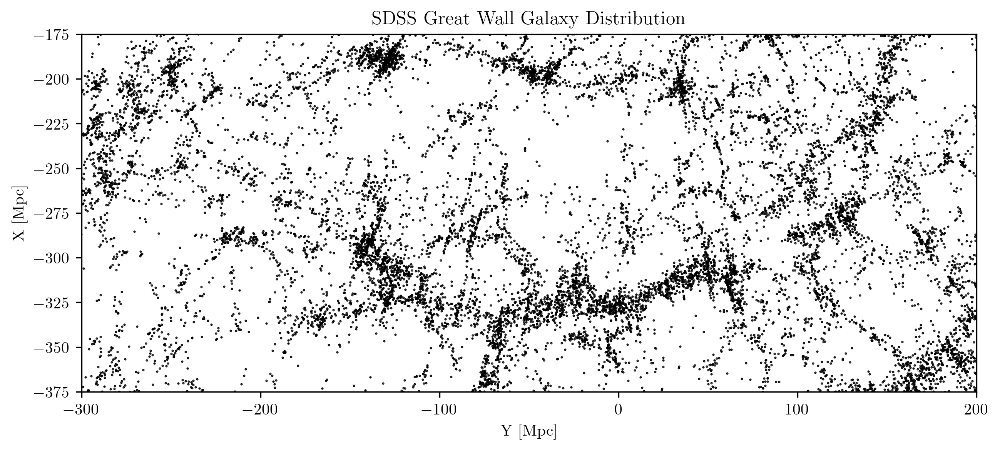

In [2]:
data_sdss = np.load('SDSS_galaxies_3D.npz', allow_pickle=True)['data']

xmin, xmax = (-375, -175)
ymin, ymax = (-300, 200)

ax = plt.subplot(111)
ax.set_aspect('equal')

ax.scatter(data_sdss[1], data_sdss[0], s=0.2, color='k')

ax.set_xlim(ymin, ymax)
ax.set_ylim(xmin, xmax)

ax.set_xlabel('Y [Mpc]')
ax.set_ylabel('X [Mpc]')
plt.title('SDSS Great Wall Galaxy Distribution')
plt.show()

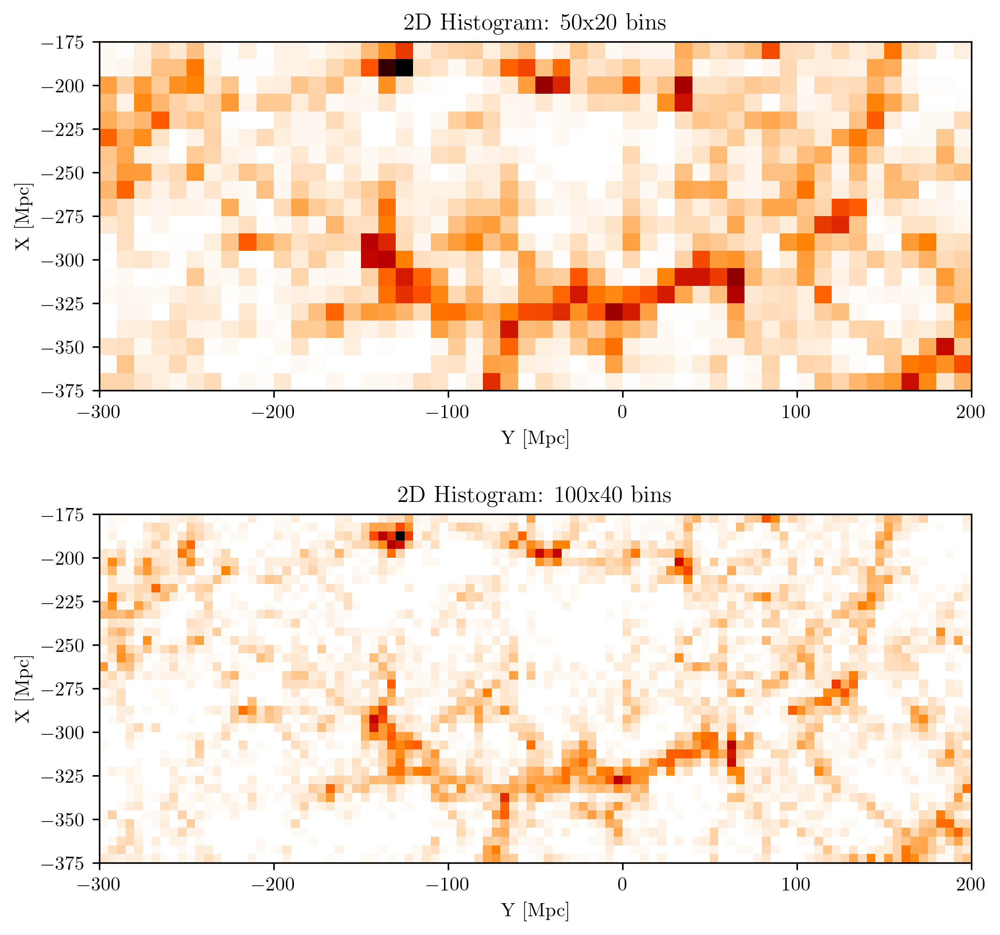

In [3]:
# Plot 2D histograms of the SDSS Great Wall data
hist_bins = [(50, 20), (100, 40)]
hist_sdss = []
hist_grid = []

plt.figure(figsize=(8, 8))

for i, bins in enumerate(hist_bins):
    ax = plt.subplot(len(hist_bins), 1, i+1)
    ax.set_aspect('equal')

    # NOTE: EDIT HERE to complete the code
    hist, xe, ye, _ = ax.hist2d(
        data_sdss[1], data_sdss[0], bins=bins,
        range=[[ymin, ymax], [xmin, xmax]], cmap='gist_heat_r'
    )
    hist_sdss.append(hist)
    hist_grid.append((xe, ye))
    
    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'2D Histogram: {bins[0]}x{bins[1]} bins')

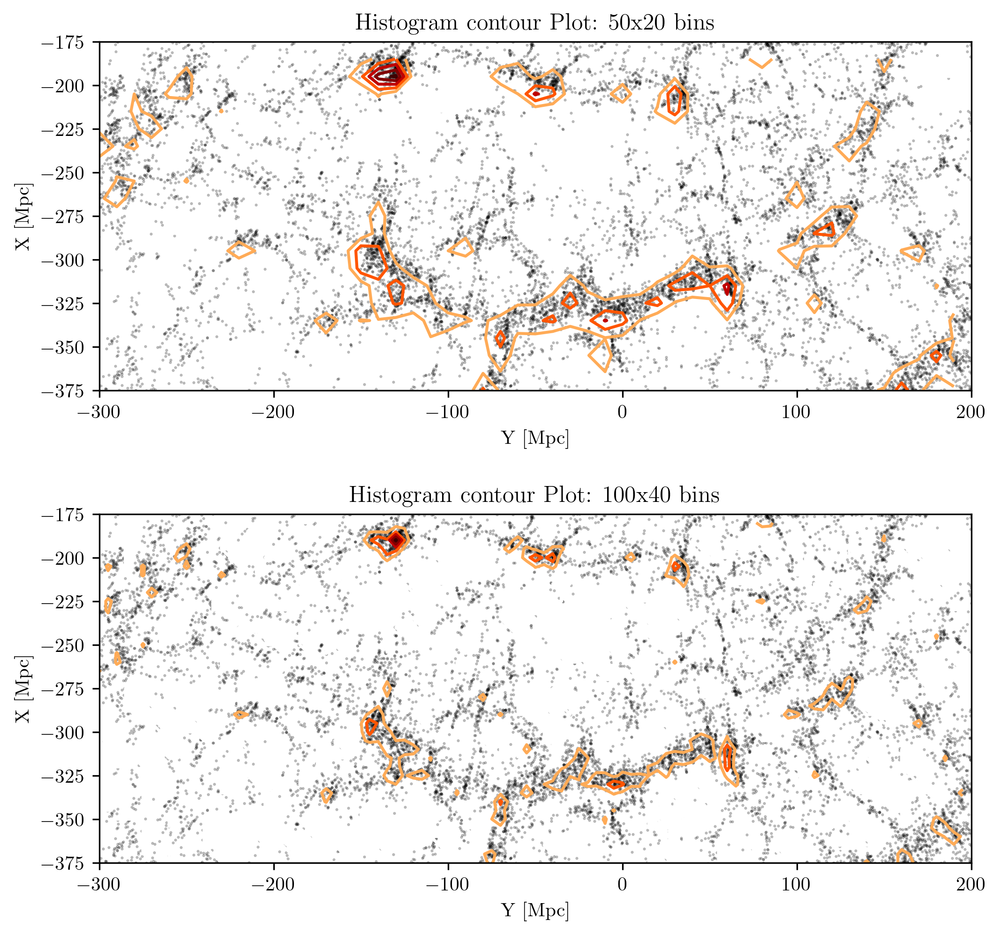

In [4]:
# Make contour plots for the 2D histograms
plt.figure(figsize=(8, 8))

for i, hist in enumerate(hist_sdss):
    ax = plt.subplot(len(hist_bins), 1, i+1)
    ax.set_aspect('equal')

    ax.scatter(data_sdss[1], data_sdss[0], s=0.2, color='k', alpha=0.3)
    ax.contour(hist_grid[i][0][:-1], hist_grid[i][1][:-1], hist.T, levels=5, cmap='gist_heat_r')

    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'Histogram contour Plot: {hist_bins[i][0]}x{hist_bins[i][1]} bins')

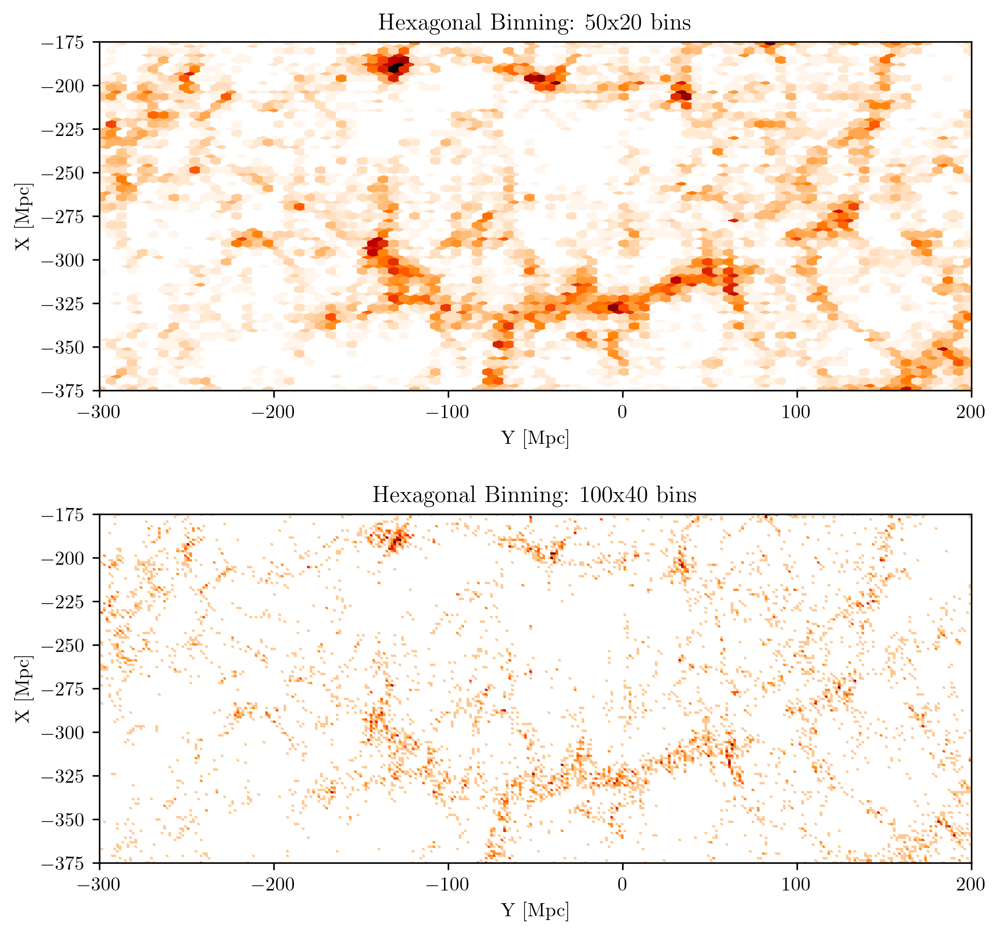

In [5]:
# Plot 2D histograms of the SDSS Great Wall data with hexagonal bins
hex_bins = [(50, 20), (100, 40)]
hex_sdss = []
gridsize = [100, 400]

plt.figure(figsize=(8, 8))

for i, bins in enumerate(hex_bins):
    ax = plt.subplot(len(hex_bins), 1, i+1)
    ax.set_aspect('equal')

    # NOTE: EDIT HERE to complete the code
    hb = ax.hexbin(
        data_sdss[1], data_sdss[0], gridsize=gridsize[i],
        cmap='gist_heat_r'
    )
    hex_sdss.append(hb)
    
    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'Hexagonal Binning: {bins[0]}x{bins[1]} bins')

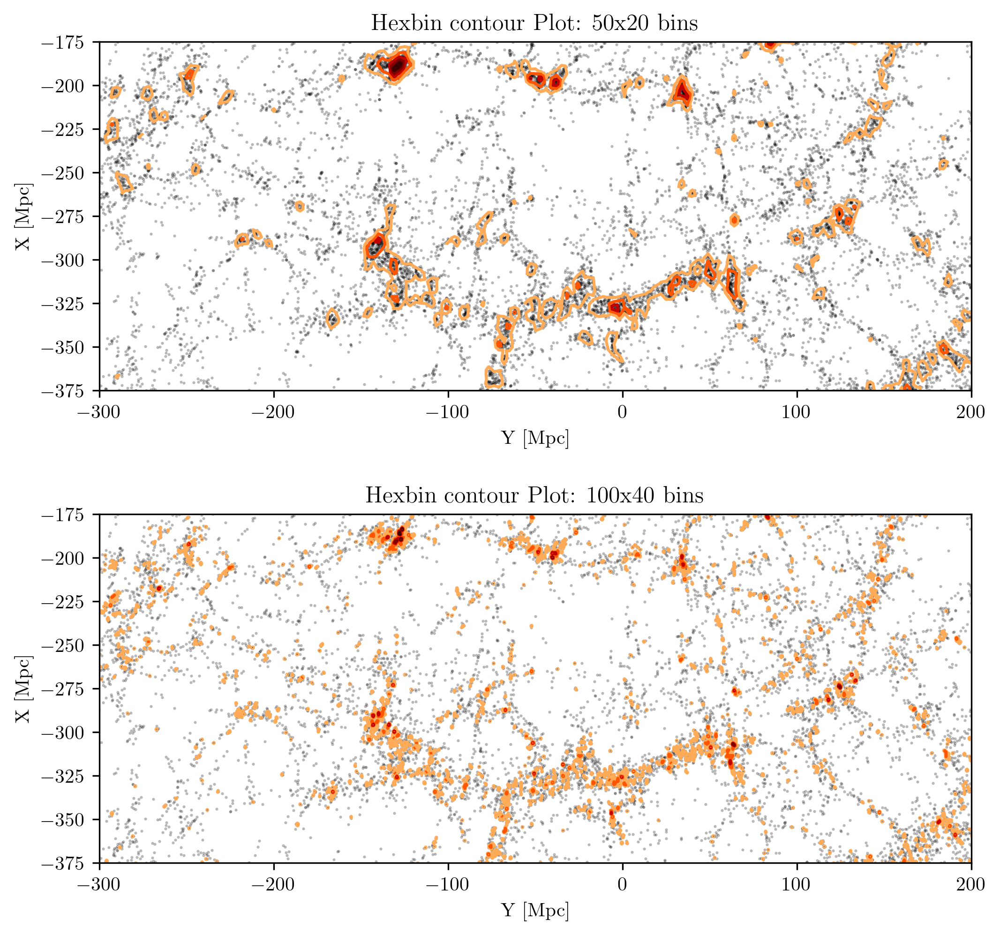

In [6]:
# Make contour plots for the 2D hexagonal histograms
plt.figure(figsize=(8, 8))

for i, hb in enumerate(hex_sdss):
    ax = plt.subplot(len(hex_bins), 1, i+1)
    ax.set_aspect('equal')

    ax.scatter(data_sdss[1], data_sdss[0], s=0.2, color='k', alpha=0.3)
    ax.tricontour(hb.get_offsets()[:,0], hb.get_offsets()[:,1], hb.get_array(), levels=5, cmap='gist_heat_r')

    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'Hexbin contour Plot: {hex_bins[i][0]}x{hex_bins[i][1]} bins')

### Question 1.2: kernel density estimation

**Tasks**:
1. Using the same dataset, perform kernel density estimation (KDE) to estimate the density of galaxies in the SDSS Great Wall region using isotropic Gaussian kernels with bandwidths of $10\,{\rm Mpc}$ and $5\,{\rm Mpc}$.
2. Plot the estimated density maps for both bandwidths using a color map.
3. Create contour plots of the estimated density for both bandwidths, overlaying the original scatter plot of galaxy positions.

In [7]:
# Create a grid for KDE evaluation
x_grid = np.linspace(xmin, xmax, 200)
y_grid = np.linspace(ymin, ymax, 500)
y_grid, x_grid = np.meshgrid(y_grid, x_grid)
grids = np.vstack([y_grid.ravel(), x_grid.ravel()]).T

In [8]:
# Create KDE maps with different bandwidths
from sklearn.neighbors import KernelDensity

bandwidths = [10, 5]  # in Mpc
kde_sdss = []

for bw in bandwidths:
    # NOTE: EDIT BELOW to complete the code
    coords = np.vstack([data_sdss[1], data_sdss[0]]).T
    kde = KernelDensity(bandwidth=bw, kernel='gaussian')
    kde.fit(coords)
    log_dens = kde.score_samples(grids)
    density = np.exp(log_dens).reshape(x_grid.shape)
    kde_sdss.append(density)

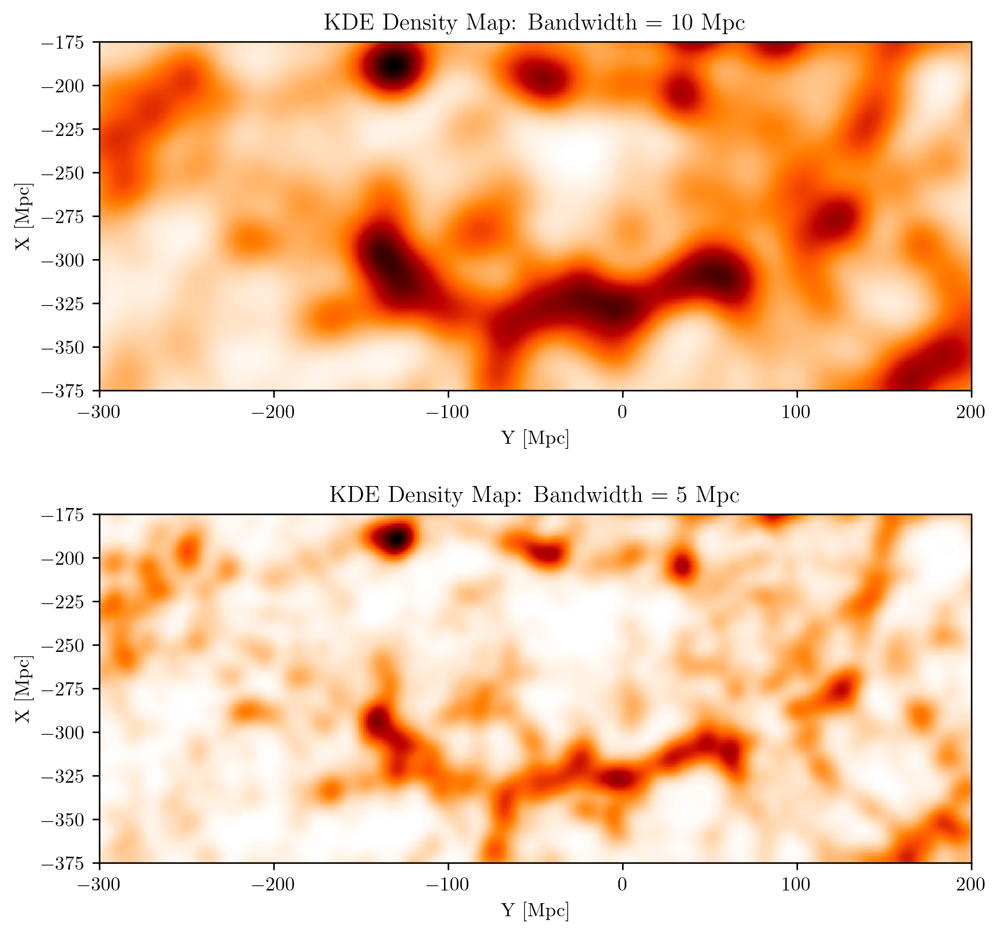

In [9]:
# Plot the KDE density maps
plt.figure(figsize=(8, 8))

for i, bw in enumerate(bandwidths):
    ax = plt.subplot(len(bandwidths), 1, i+1)
    ax.set_aspect('equal')

    im = ax.imshow(kde_sdss[i], extent=[ymin, ymax, xmin, xmax],
                   origin='lower', cmap='gist_heat_r')

    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'KDE Density Map: Bandwidth = {bw} Mpc')

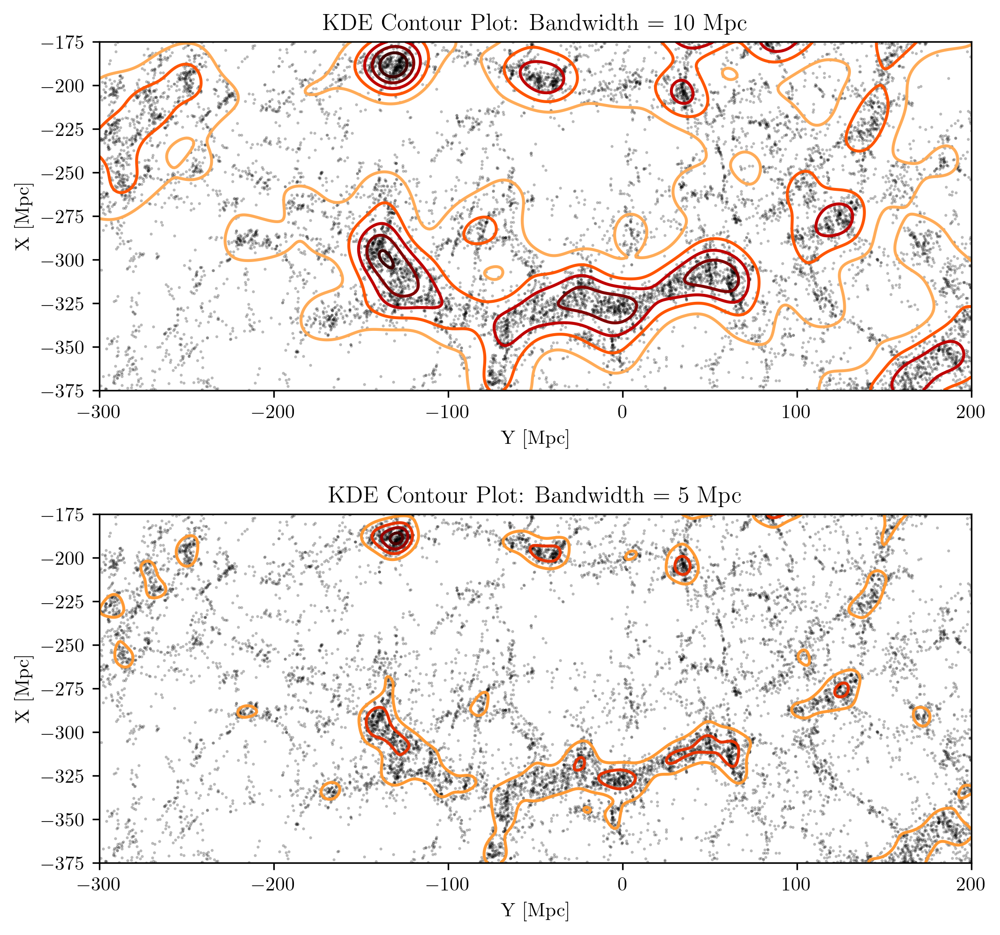

In [ ]:
# Make contour plots of the KDE density maps
plt.figure(figsize=(8, 8))

for i, bw in enumerate(bandwidths):
    ax = plt.subplot(len(bandwidths), 1, i+1)
    ax.set_aspect('equal')
    ax.scatter(data_sdss[1], data_sdss[0], s=0.2, color='k', alpha=0.3)
    ax.contour(y_grid, x_grid, kde_sdss[i], levels=5, cmap='gist_heat_r')

    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'KDE Contour Plot: Bandwidth = {bw} Mpc')

### Question 1.3: k-nearest neighbors density estimation

**Tasks**:
1. Using the same dataset, perform k-nearest neighbors (k-NN) density estimation to estimate the density of galaxies in the SDSS Great Wall region with $k=50, 100, 150$.
2. Plot the estimated density maps for all three values of $k$ using a color map.
3. Create contour plots of the estimated density for all three values of $k$, overlaying the original scatter plot of galaxy positions.
4. Discuss your results throughout the exercise, comparing the different density estimation methods and parameter choices. Consider aspects such as resolution, smoothness, and the ability to capture structures in the galaxy distribution.

In [23]:
# Create k-NN density maps with different k values
from sklearn.neighbors import NearestNeighbors

k_values = [50, 100, 150]
knn_sdss = []

for k in k_values:
    # NOTE: EDIT BELOW to complete the code
    nbrs = NearestNeighbors(n_neighbors=k).fit(coords)
    distances, _ = nbrs.kneighbors(grids)
    r_k = distances[:, -1]  # distance to k-th nearest neighbor
    N = coords.shape[0]
    eps = 1e-12
    # 2D k-NN density: rho = k / (N * area), area = pi * r_k^2
    density = k / (N * (np.pi * r_k**2 + eps))
    knn_sdss.append(density.reshape(y_grid.shape))

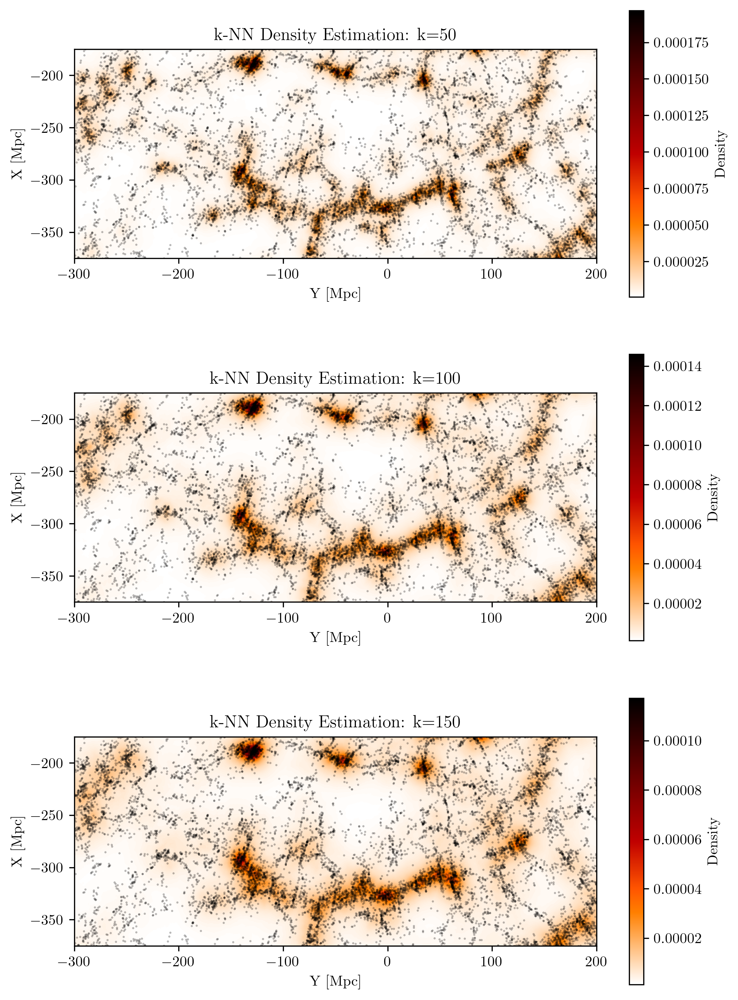

In [25]:
# Plot the k-NN density maps
plt.figure(figsize=(8, 12))

for i, density in enumerate(knn_sdss):
    ax = plt.subplot(len(k_values), 1, i+1)
    ax.set_aspect('equal')

    # NOTE: EDIT BELOW to complete the code
    im = ax.imshow(density, extent=[ymin, ymax, xmin, xmax], origin='lower', cmap='gist_heat_r')
    ax.scatter(data_sdss[1], data_sdss[0], s=0.2, color='k', alpha=0.3)
    plt.colorbar(im, ax=ax, label='Density')

    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'k-NN Density Estimation: k={k_values[i]}')

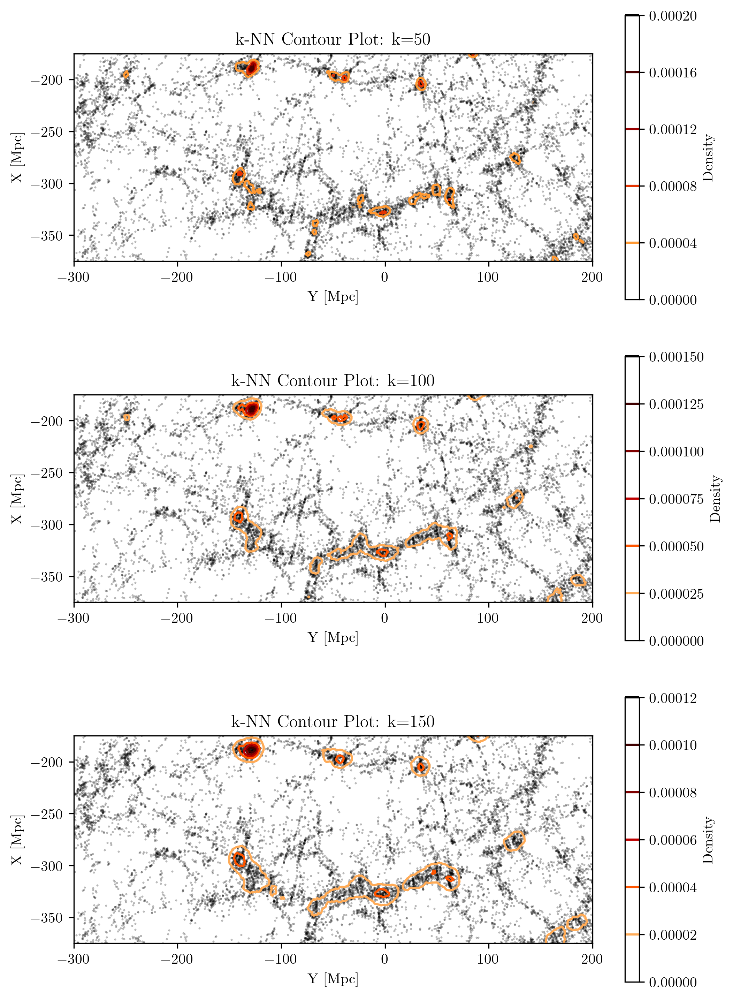

In [26]:
# Make contour plots of the k-NN density maps
plt.figure(figsize=(8, 12))

for i, density in enumerate(knn_sdss):
    ax = plt.subplot(len(k_values), 1, i+1)
    ax.set_aspect('equal')

    # NOTE: EDIT BELOW to complete the code
    ax.scatter(data_sdss[1], data_sdss[0], s=0.2, color='k', alpha=0.3)
    cs = ax.contour(y_grid, x_grid, density, levels=5, cmap='gist_heat_r')
    plt.colorbar(cs, ax=ax, label='Density')
    
    ax.set_xlim(ymin, ymax)
    ax.set_ylim(xmin, xmax)
    ax.set_xlabel('Y [Mpc]')
    ax.set_ylabel('X [Mpc]')
    ax.set_title(f'k-NN Contour Plot: k={k_values[i]}')

##### Discussions

利用不同的方法 (k-NN, KDE) 和几种分布图，能够对 SDSS 的数据做出比较合理的密度估计，画出高密度区的范围.

### Exercise 2: velocity distribution of stars

We observe the line-of-sight velocities of stars in a certain region of the Milky Way. There are 3 distinct stellar populations in this region, each with its own velocity distribution:
1. A thin disk population with a mean velocity of $0\,{\rm km/s}$ and a standard deviation of $15\,{\rm km/s}$.
2. A thick disk population with a mean velocity of $-100\,{\rm km/s}$ and a standard deviation of $50\,{\rm km/s}$.
3. A halo population with a mean velocity of $120\,{\rm km/s}$ and a standard deviation of $100\,{\rm km/s}$.

The observed velocities are a mixture of these 3 populations, with proportions of $10\%$, $40\%$, and $50\%$, respectively.

#### Question 2.1: histograms

**Tasks**:
1. Simulate datasets of observed line-of-sight velocities for 500 and 5000 stars based on the given mixture model.
2. Plot the histograms of the simulated datasets using different bins/methods: Scott's rule, Freedman-Diaconis rule, Knuth method, and Bayesian blocks. Overlay the true underlying velocity distribution on each histogram for comparison.

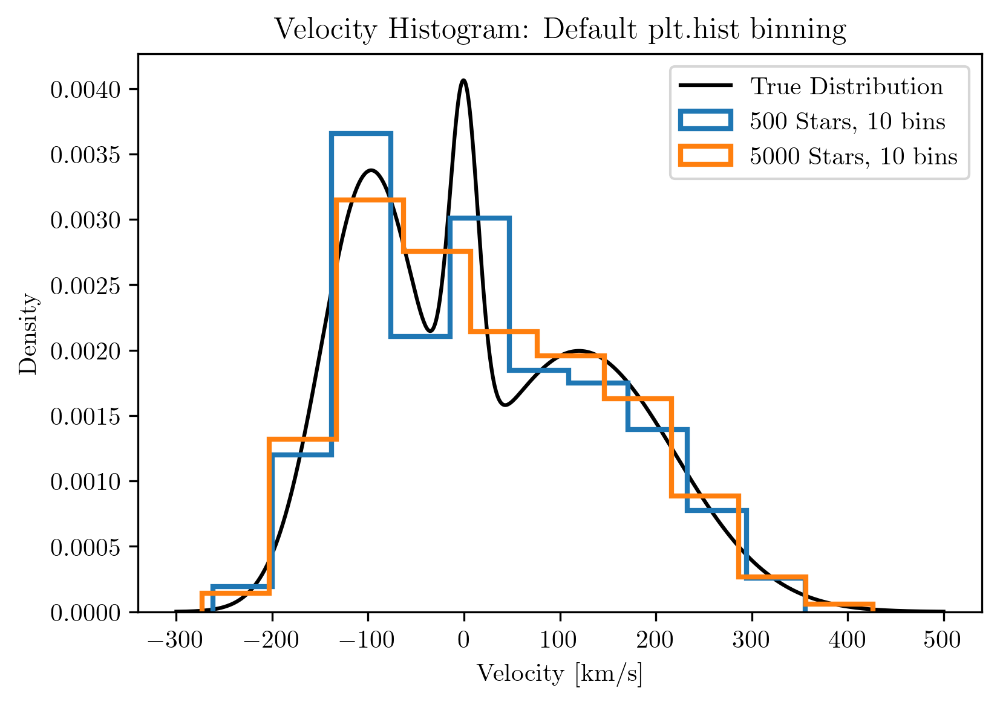

In [ ]:
from scipy.stats import norm

# Set the random seed
seed = 2024011182  # NOTE: EDIT HERE to insert your seed

# Setup the velocity distribution parameters
num_samples = 5000
num_stars = [500, 5000]
vel_means = [0, -100, 120]      # in km/s
vel_stds = [15, 50, 100]        # in km/s
vel_weights = [0.1, 0.4, 0.5]   # population proportions

# Generate random velocities
rng = np.random.default_rng(seed)
velocities = np.array([])
for mean, std, weight in zip(vel_means, vel_stds, vel_weights):
    # NOTE: EDIT BELOW to complete the code
    # determine number of stars for this component; assign remainder to last component
    if np.isclose(weight, vel_weights[-1]):
        n_stars = int(num_samples - velocities.size)
    else:
        n_stars = int(round(weight * num_samples))
    vel_samples = rng.normal(loc=mean, scale=std, size=n_stars)
    velocities = np.concatenate([velocities, vel_samples])

# Shuffle the velocities
rng.shuffle(velocities)

# Generate the theoretical velocity distribution for comparison
x_theory = np.linspace(-300, 500, 1000)
y_theory = np.zeros_like(x_theory)
for mean, std, weight in zip(vel_means, vel_stds, vel_weights):
    y_theory += weight * norm.pdf(x_theory, loc=mean, scale=std)

# Plot the histogram of observed velocities using the default binning of plt.hist
plt.figure(figsize=(6, 4))
labels = []

plt.plot(x_theory, y_theory, 'k-')
labels.append('True Distribution')

for n in num_stars:
    hv, bins, _ = plt.hist(velocities[:n], lw=2, histtype='step', density=True)
    labels.append(f'{n} Stars, {len(bins)-1} bins')

plt.xlabel('Velocity [km/s]')
plt.ylabel('Density')
plt.ylim(0, None)
plt.title('Velocity Histogram: Default plt.hist binning')

plt.legend(labels=labels);
plt.show()

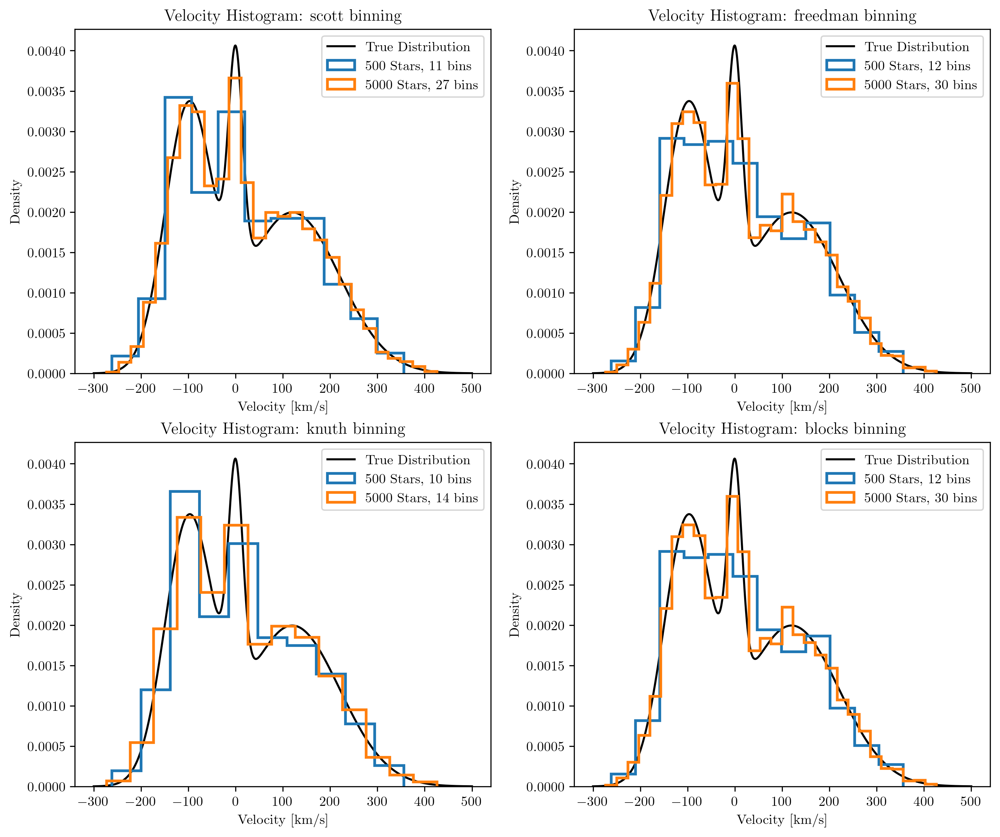

In [ ]:
# 这里没有用 astroML.density_estimation 的 KNeighborsDensity 函数，因为我发现用这个会报错：
# '''ValueError: numpy.dtype size changed, may indicate binary incompatibility.
# Expected 96 from C header, got 88 from PyObject'''
# 这个报错应该是 astroML 和 numpy 的版本不匹配问题，但是我是在本地环境完成作业的所以比较难修改.
# 因此我做了等价的替换，后面所有涉及到 astroML 的代码同理.
methods = ['scott', 'freedman', 'knuth', 'blocks']
plt.figure(figsize=(12, 10))

for method in methods:
    ax = plt.subplot(2, 2, methods.index(method)+1)
    labels = []
    
    ax.plot(x_theory, y_theory, 'k-')
    labels.append('True Distribution')

    for n in num_stars:
        data = velocities[:n]
        # choose bin edges according to method (approximate knuth/blocks with numpy methods)
        if method == 'scott':
            # Scott's rule: bin width h = 3.5 * sigma / n^(1/3)
            sigma = np.std(data, ddof=1)
            h = 3.5 * sigma / (n ** (1/3)) if n > 0 else 0
            if h <= 0 or np.isclose(h, 0):
                bins = 10
                edges = np.linspace(data.min(), data.max(), bins + 1)
            else:
                nbins = max(1, int(np.ceil((data.max() - data.min()) / h)))
                edges = np.linspace(data.min(), data.max(), nbins + 1)
            hv, edges, _ = ax.hist(data, bins=edges, lw=2, histtype='step', density=True)
        elif method == 'freedman':
            edges = np.histogram_bin_edges(data, bins='fd')
            hv, edges, _ = ax.hist(data, bins=edges, lw=2, histtype='step', density=True)
        elif method == 'knuth':
            # approximate Knuth with 'sturges' (safe fallback without astropy)
            edges = np.histogram_bin_edges(data, bins='sturges')
            hv, edges, _ = ax.hist(data, bins=edges, lw=2, histtype='step', density=True)
        elif method == 'blocks':
            # approximate Bayesian blocks with numpy 'auto' as a fallback
            edges = np.histogram_bin_edges(data, bins='auto')
            hv, edges, _ = ax.hist(data, bins=edges, lw=2, histtype='step', density=True)
        else:
            hv, edges, _ = ax.hist(data, bins='auto', lw=2, histtype='step', density=True)

        labels.append(f'{n} Stars, {len(edges)-1} bins')
    
    ax.set_xlabel('Velocity [km/s]')
    ax.set_ylabel('Density')
    ax.set_ylim(0, None)
    ax.set_title(f'Velocity Histogram: {method} binning')
    ax.legend(labels=labels)

#### Question 2.2: kernel density estimation

**Tasks**:
1. Using the same simulated datasets (for both 500 and 5000 stars), perform kernel density estimation (KDE) with Gaussian kernel to estimate the velocity distribution of stars. Experiment with different bandwidth selection methods: Scott's rule of thumb, Silverman's rule, and cross-validation (with both the leave-one-out cross-validation method and another cross-validation method available in `sklearn.model_selection`).
2. Plot the estimated velocity distributions for each bandwidth selection method, overlaying the true underlying velocity distribution for comparison.

**Hint**: Cross-validation methods can be found here: https://scikit-learn.org/stable/modules/cross_validation.html

In [30]:
# Helper functions for Scott's and Silverman's rules
def scott_bandwidth(data):
    # NOTE: EDIT BELOW to complete the code
    data = np.asarray(data)
    n = data.size
    if n <= 1:
        return 1.0
    sigma = np.std(data, ddof=1)
    # fallback if std is zero
    if sigma <= 0:
        rng = data.max() - data.min()
        sigma = rng / 1.349 if rng > 0 else 1.0
    return 1.06 * sigma * n ** (-1/5)

def silverman_bandwidth(data):
    data = np.asarray(data)
    n = data.size
    if n <= 1:
        return 1.0
    sigma = np.std(data, ddof=1)
    q25, q75 = np.percentile(data, [25, 75])
    # NOTE: EDIT BELOW to complete the code
    iqr = q75 - q25
    # Silverman's rule: 0.9 * min(std, IQR/1.34) * n^(-1/5)
    s = min(sigma, iqr / 1.34) if iqr > 0 else sigma
    if s <= 0:
        return 1.0
    return 0.9 * s * n ** (-1/5)

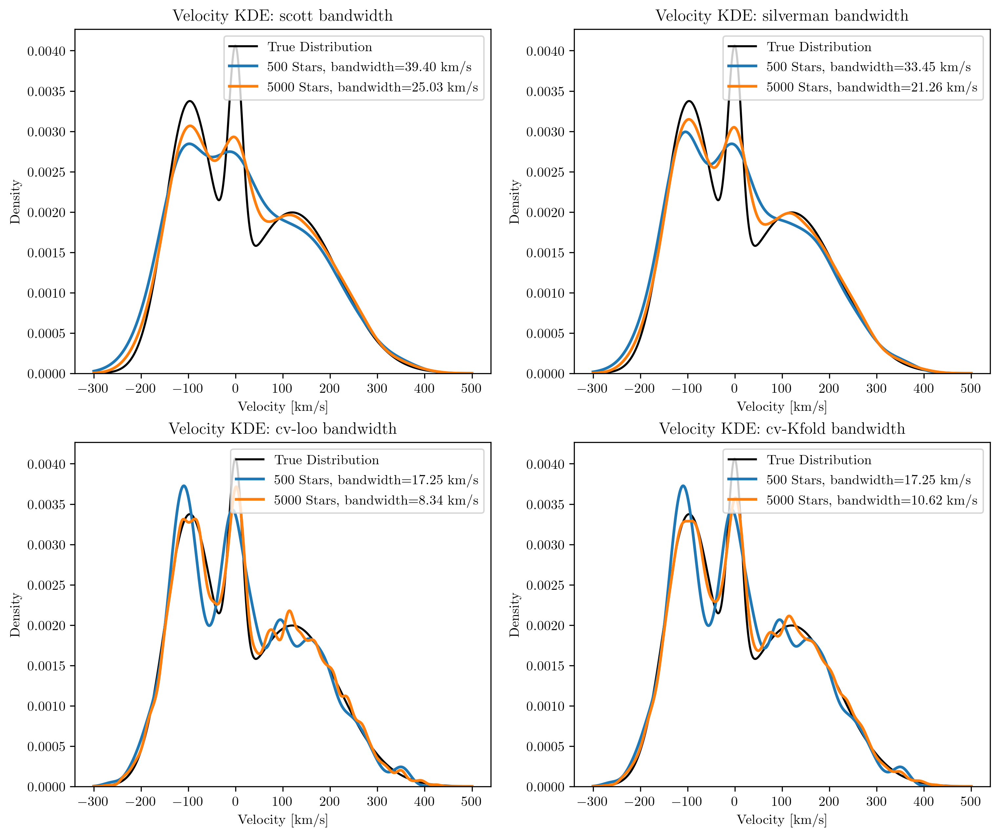

In [31]:
# Create KDE estimates with different bandwidth selection methods
from sklearn.model_selection import GridSearchCV, LeaveOneOut

# NOTE: Replace 'cv-XXX' by your chosen cross-validation method
bw_methods = ['scott', 'silverman', 'cv-loo', 'cv-Kfold']
# cv-Kfold 指的是，将数据分为 K 份，每次从中间取出 (K-1) 份作为训练集，剩下 1 份作为测试集，
# 然后做 K 次取 MSE (Mean Squared Error, 均方误差) 的均值，作为最后这个模型的 MSE.
# cv-loo 是这种方法的一个极限情况，每次只取一个数据点作为测试集.
# cv-loo 更加精确，但是计算量也更大.

bandwidth_grid = np.logspace(0.5, 2.5, 20)
x_grid = np.linspace(-300, 500, 1000).reshape(-1, 1)
plt.figure(figsize=(12, 10))

for method in bw_methods:
    ax = plt.subplot(2, 2, bw_methods.index(method)+1)
    labels = []
    
    ax.plot(x_theory, y_theory, 'k-')
    labels.append('True Distribution')

    for n in num_stars:
        if method == 'scott':
            bw = scott_bandwidth(velocities[:n])
            # NOTE: EDIT HERE to complete the code
            kde = KernelDensity(bandwidth=bw)
        elif method == 'silverman':
            bw = silverman_bandwidth(velocities[:n])
            # NOTE: EDIT HERE to complete the code
            kde = KernelDensity(bandwidth=bw)
        elif method == 'cv-loo':
            # NOTE: EDIT HERE to complete the code
            param_grid = {'bandwidth': bandwidth_grid}
            kde = GridSearchCV(KernelDensity(kernel='gaussian'), param_grid, cv=LeaveOneOut())
        elif method == 'cv-Kfold':
            # NOTE: EDIT HERE to complete the code
            param_grid = {'bandwidth': bandwidth_grid}
            kde = GridSearchCV(KernelDensity(kernel='gaussian'), param_grid, cv=5)
            # 一般而言，我们按照经验取 K = 5 或 10，
            # 取到 10 的时候和 cv-loo 的差异就不大了，所以这里取 5 体现一下差异.

        kde.fit(velocities[:n].reshape(-1, 1))
        if method != 'scott' and method != 'silverman':
            bw = kde.best_params_['bandwidth']

        log_density = kde.score_samples(x_grid)
        density = np.exp(log_density)
        
        ax.plot(x_grid[:, 0], density, lw=2)
        labels.append(f'{n} Stars, bandwidth={bw:.2f} km/s')
    
    ax.set_xlabel('Velocity [km/s]')
    ax.set_ylabel('Density')
    ax.set_ylim(0, None)
    ax.set_title(f'Velocity KDE: {method} bandwidth')
    ax.legend(labels=labels)

#### Question 2.3: histogram with measurement errors

Assume that the observed line-of-sight velocities have measurement errors that follow a Gaussian distribution with a standard deviation of $10\,{\rm km/s}$: $v_e \sim \mathcal{N}(0, 10^2)$. The observed velocity is then $v_{\rm obs} = v + v_e$, where $v$ is the true velocity from the mixture model.

**Tasks**:
1. Simulate new datasets of observed line-of-sight velocities for 500 and 5000 stars, incorporating the measurement errors.
2. Plot the histograms of the new simulated datasets using different bins/methods: Scott's rule, Freedman-Diaconis rule, Knuth method, and Bayesian blocks. Overlay the true underlying velocity distribution on each histogram.

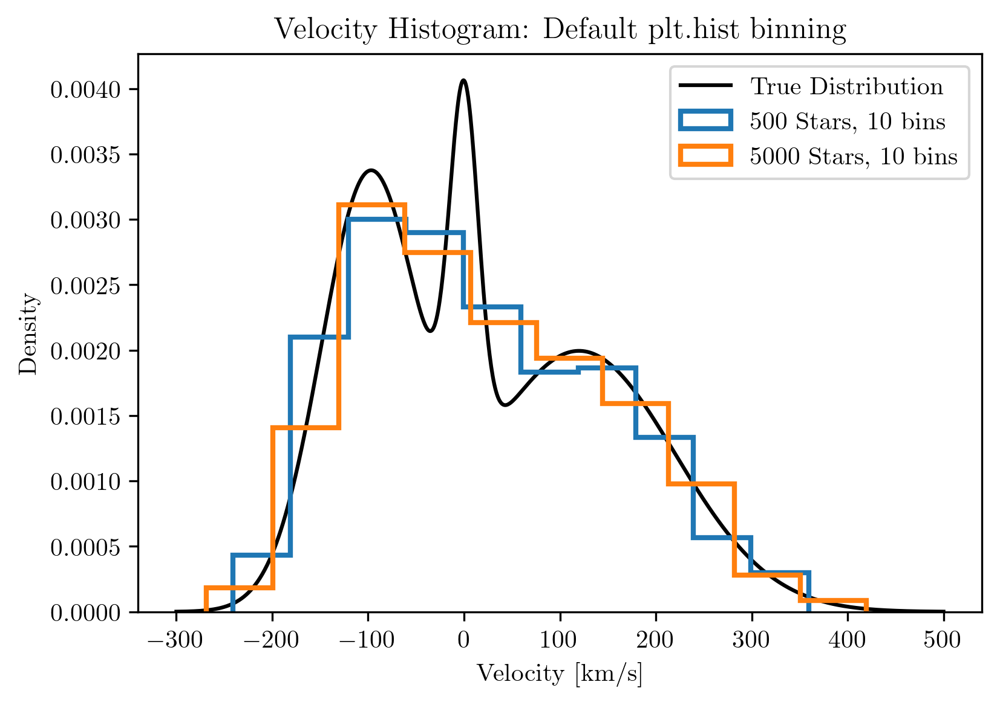

In [35]:
# Simulate observed velocities with measurement errors
error_std = 10  # km/s
# NOTE: EDIT HERE to complete the code
rng = np.random.default_rng(seed)

# generate Gaussian measurement errors and add to true velocities
errors = rng.normal(loc=0.0, scale=error_std, size=velocities.size)
velocities_obs = velocities + errors

# Plot the histogram of observed velocities using the default binning of plt.hist
plt.figure(figsize=(6, 4))
labels = []

plt.plot(x_theory, y_theory, 'k-')
labels.append('True Distribution')

for n in num_stars:
    hv, bins, _ = plt.hist(velocities_obs[:n], lw=2, histtype='step', density=True)
    labels.append(f'{n} Stars, {len(bins)-1} bins')

plt.xlabel('Velocity [km/s]')
plt.ylabel('Density')
plt.ylim(0, None)
plt.title('Velocity Histogram: Default plt.hist binning')

plt.legend(labels=labels)
pass

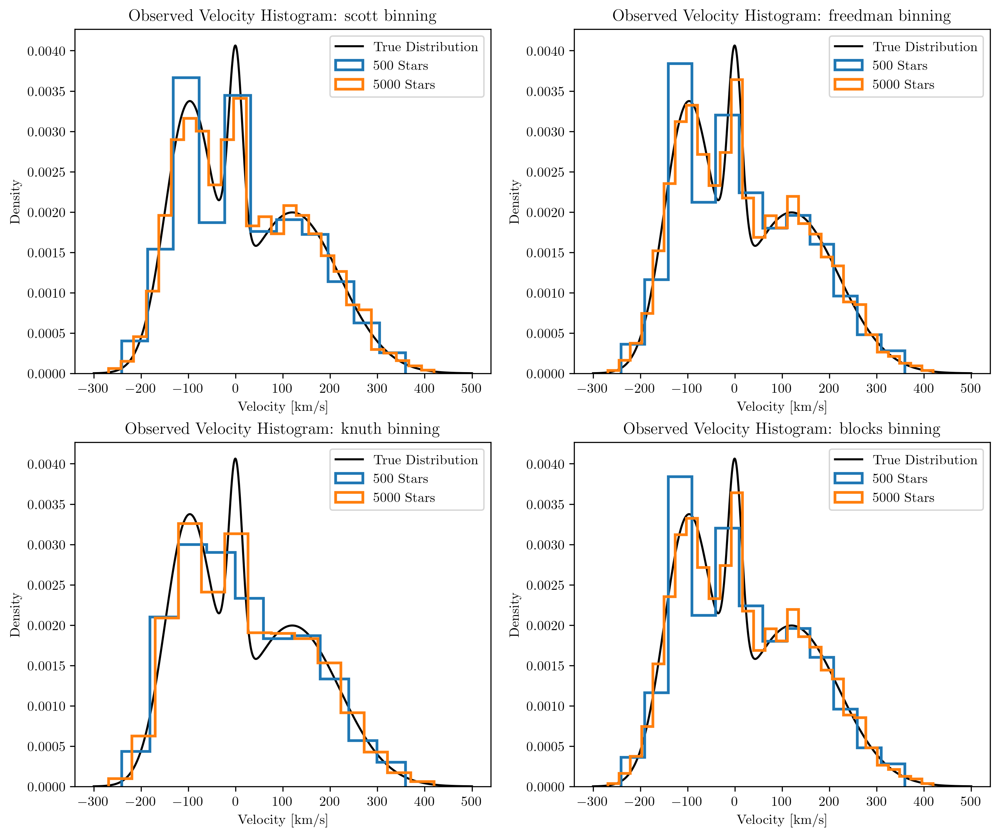

In [38]:
methods = ['scott', 'freedman', 'knuth', 'blocks']
plt.figure(figsize=(12, 10))

for method in methods:
    ax = plt.subplot(2, 2, methods.index(method) + 1)
    ax.plot(x_theory, y_theory, 'k-', label='True Distribution')

    # plot histograms using numpy/matplotlib bin-selection alternatives
    for n in num_stars:
        data = velocities_obs[:n]
        if method == 'scott':
            # Scott's rule: h = 3.5 * sigma / n^(1/3)
            sigma = np.std(data, ddof=1)
            h = 3.5 * sigma / (n ** (1/3)) if n > 0 else 0
            if h <= 0 or np.isclose(h, 0):
                edges = np.linspace(data.min(), data.max(), 11)
            else:
                nbins = max(1, int(np.ceil((data.max() - data.min()) / h)))
                edges = np.linspace(data.min(), data.max(), nbins + 1)
        elif method == 'freedman':
            edges = np.histogram_bin_edges(data, bins='fd')
        elif method == 'knuth':
            # approximate Knuth with 'sturges' as a safe fallback
            edges = np.histogram_bin_edges(data, bins='sturges')
        elif method == 'blocks':
            # approximate Bayesian blocks with 'auto' fallback
            edges = np.histogram_bin_edges(data, bins='auto')
        else:
            edges = np.histogram_bin_edges(data, bins='auto')

        ax.hist(data, bins=edges, histtype='step', density=True, lw=2, label=f'{n} Stars')

    ax.set_xlabel('Velocity [km/s]')
    ax.set_ylabel('Density')
    ax.set_ylim(0, None)
    ax.set_title(f'Observed Velocity Histogram: {method} binning')
    ax.legend()

#### Question 2.4: kernel density estimation with measurement errors

Assume the distribution of measurement errors in Question 2.3 is known (normal with mean 0 and standard deviation $\sigma_e = 10$ km/s). For a Gaussian KDE kernel with bandwidth $h$, the deconvolved kernel accounting for measurement errors can be expressed as another Gaussian with an effective bandwidth of $\sqrt{h^2 - \sigma_e^2}$.

**Tasks**:
1. Using the datasets simulated in Question 2.3, perform kernel density estimation (KDE) with and without accounting for measurement errors. Use the best bandwidth you found in Question 2.2 for both cases.
2. Plot the estimated velocity distributions for both cases, overlaying the true underlying velocity distribution for comparison.
3. Discuss all your results throughout the exercise.

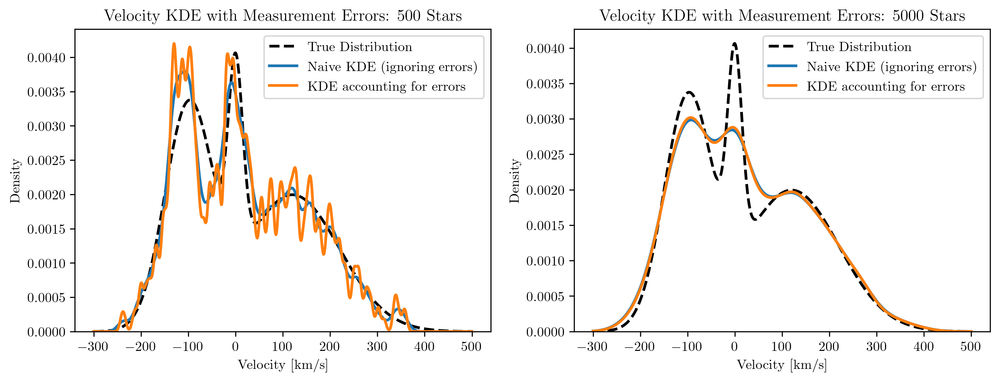

In [ ]:
# Optimal bandwidths found previously for 500 and 5000 stars
# 找了 2.1 问的结果，综合比较下来还是 scott's rule 给出的 bins 比较合理.
best_bandwidth = [11, 27]

plt.figure(figsize=(12, 4))

for i, n in enumerate(num_stars):
    ax = plt.subplot(1, 2, i+1)
    labels = []

    # True distribution
    ax.plot(x_theory, y_theory, 'k--', lw=2)
    labels.append('True Distribution')
    
    # KDE without accounting for measurement errors
    # NOTE: EDIT BELOW to complete the code
    bw = best_bandwidth[i]
    kde = KernelDensity(kernel='gaussian', bandwidth=bw)
    kde.fit(velocities_obs[:n].reshape(-1, 1))
    density = np.exp(kde.score_samples(x_grid))
    
    ax.plot(x_grid[:, 0], density, lw=2)
    labels.append('Naive KDE (ignoring errors)')
    
    # KDE accounting for measurement errors
    # NOTE: EDIT BELOW to complete the code
    # deconvolve measurement error by reducing the KDE bandwidth:
    sigma_e = error_std   # measurement error std (10 km/s)
    h_eff = np.sqrt(max(bw**2 - sigma_e**2, 1e-6))
    kde_err = KernelDensity(kernel='gaussian', bandwidth=h_eff)
    kde_err.fit(velocities_obs[:n].reshape(-1, 1))
    density_err = np.exp(kde_err.score_samples(x_grid))
    
    ax.plot(x_grid[:, 0], density_err, lw=2)
    labels.append('KDE accounting for errors')
    
    ax.set_xlabel('Velocity [km/s]')
    ax.set_ylabel('Density')
    ax.set_ylim(0, None)
    ax.set_title(f'Velocity KDE with Measurement Errors: {n} Stars')
    ax.legend(labels=labels)

##### Discussions

很明显，我们的结论和 bandwidth 以及是否抵消误差是强相关的，在实际做 KDE 的时候应该多采用不同的 bins 选择方案，找到最佳的 bins 数，同时合理考虑误差的分布情况，得到最终的结果.

### Note: steps for submitting the exercise

1. In the menu bar, select `File > Download` to download your notebook as a `.ipynb` file.
2. Select `File > Save and Export Notebook As > PDF` to export your notebook as a PDF file.
3. Combine the `.ipynb` and `.pdf` files into a single `.zip` or `.tar.gz` archive.
4. Upload your archive to the web learning platform (网络学堂).